# Lending Club Case Study EDA

## Introduction
### Goal
The goal is to minimize the risk of both businss and finacial loss while lending to customers.
### Problem statement
*This credit lending firm is the largest **online credit lending platfrom, facilitating personal loans, business loans, and financing of medical procedures**. Borrowers can easily access lower interest rate loans through a fast online interface. Like most other lending companies, lending loans to **‘risky’** applicants is the largest source of financial loss (called credit loss). **Credit loss** is the amount of money lost by the lender when the borrower refuses to pay or runs away with the money owed. In other words, borrowers who default cause the largest amount of loss to the lenders. In this case, the customers labelled as 'charged-off' are the 'defaulters'. *

### Target
The target is to perform data analysis to reduce the credit Loss and to identify the factors that contribute in credit defaults.
### Risk associated with the problem
 - If the applicant is likely to repay the loan, then not approving loan is a loss of business (rejecting loans for non - default).
 - If the applicant is not likely to repay the loan, then approving loan may lead to financial loss (approving loans for default).
The given dataset contains information about past loans and each row represents the loan details of the applicants.

#### Steps followed In this analysis are:
 1.Data understanding.<br>
 2.Data cleaning.<br>
 3.Data Analysis.<br>
 4.Recommendations.<br>

### Data Understanding

### Loading Libraries and Data

In [41]:
#importing Libraries for data manipulation
import pandas as pd #dataframe
import numpy as np #numerical python
#importing Libraries for data visualization
import seaborn as sns #data visualization
import matplotlib.pyplot as plt #plotting
import plotly.express as px #plotting

In [42]:
# Ignore warnings due to version problems
import warnings
warnings.filterwarnings('ignore')

In [43]:
#Loading the data
loan = pd.read_csv('loan.csv')

### Printing the top rows of the dataframe.

In [44]:
loan.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


### Basic information about the data

In [45]:
#Basic information about the data
## Number of rows and columns
print('Number of Columns:',loan.shape[1])
print('Number of Rows:',loan.shape[0])
## Number of missing values
print('Number of missing values:',loan.isnull().sum().sum())
## Number of unique values
print('Number of unique values:',loan.nunique().sum())
## Number of duplicates
print('Number of duplicates:',loan.duplicated().sum())

Number of Columns: 111
Number of Rows: 39717
Number of missing values: 2263364
Number of unique values: 416801
Number of duplicates: 0


In [46]:
# Basic infomation about the dataframe
loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [47]:
# Data types of each column
loan.dtypes

id                              int64
member_id                       int64
loan_amnt                       int64
funded_amnt                     int64
funded_amnt_inv               float64
                               ...   
tax_liens                     float64
tot_hi_cred_lim               float64
total_bal_ex_mort             float64
total_bc_limit                float64
total_il_high_credit_limit    float64
Length: 111, dtype: object

In [48]:
# Describing the dataframe
loan.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


In [49]:
# Columns in the dataframe
loan.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       ...
       'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
       'percent_bc_gt_75', 'pub_rec_bankruptcies', 'tax_liens',
       'tot_hi_cred_lim', 'total_bal_ex_mort', 'total_bc_limit',
       'total_il_high_credit_limit'],
      dtype='object', length=111)

### Data Cleaning

In [50]:
# Check for duplicate rows in dataset based on id column

print(loan.duplicated(subset=None, keep='first').count())
dup=loan[loan.duplicated(['id'])]
dup

# There are no duplicate rows in loan dataset

39717


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit


In [51]:
# sum it up to check how many rows have all missing values
print('Number of empty Rows:')
print(loan.isnull().all(axis=1).sum())
# Observation: There are no empty rows in whole dataset.

# sum it up to check how many columns have all missing values
print('Number of empty Columns:')
print(loan.isnull().all(axis=0).sum())
# Observation: There are 54 columns have all missing values.

Number of empty Rows:
0
Number of empty Columns:
54


In [52]:
## Checking for missing values
print(loan.isnull().sum())

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 111, dtype: int64


In [53]:
# Checking column with large amount of null values(in percentage) and irrelevant columns
print((loan.isnull().sum()/loan.shape[0]*100).round(2).sort_values(ascending=False))

verification_status_joint    100.0
annual_inc_joint             100.0
mo_sin_old_rev_tl_op         100.0
mo_sin_old_il_acct           100.0
bc_util                      100.0
                             ...  
delinq_amnt                    0.0
policy_code                    0.0
earliest_cr_line               0.0
delinq_2yrs                    0.0
id                             0.0
Length: 111, dtype: float64


In [54]:
# removing the columns having more than 60% missing values
missing_columns = loan.columns[100*(loan.isnull().sum()/len(loan.index)) > 60]
print(missing_columns)

Index(['mths_since_last_delinq', 'mths_since_last_record', 'next_pymnt_d',
       'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint',
       'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal',
       'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m',
       'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m',
       'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi',
       'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal',
       'bc_open_to_buy', 'bc_util', 'mo_sin_old_il_acct',
       'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl',
       'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq',
       'mths_since_recent_inq', 'mths_since_recent_revol_delinq',
       'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl',
       'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl',
       'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_120dpd_2m',
       'num_t

### To improve the accuracy of analysis, columns with more than 60% missing vales are removed in the below code.

In [55]:
#dropping the columns having more than 60% missing values
loan = loan.drop(missing_columns, axis=1)
print(loan.shape)

(39717, 54)


In [56]:
# Checking columns again for null value percentage
print((loan.isnull().sum()/loan.shape[0]*100).round(2).sort_values(ascending=False))

desc                          32.58
emp_title                      6.19
emp_length                     2.71
pub_rec_bankruptcies           1.75
last_pymnt_d                   0.18
collections_12_mths_ex_med     0.14
chargeoff_within_12_mths       0.14
revol_util                     0.13
tax_liens                      0.10
title                          0.03
last_credit_pull_d             0.01
total_rec_prncp                0.00
out_prncp                      0.00
initial_list_status            0.00
out_prncp_inv                  0.00
total_acc                      0.00
total_pymnt                    0.00
total_pymnt_inv                0.00
collection_recovery_fee        0.00
total_rec_int                  0.00
total_rec_late_fee             0.00
recoveries                     0.00
pub_rec                        0.00
last_pymnt_amnt                0.00
policy_code                    0.00
application_type               0.00
acc_now_delinq                 0.00
delinq_amnt                 

In [57]:
# Columns in the dataframe
print(loan.columns)

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'initial_list_status',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'collections_12_mths_ex_med', 'policy_code',
       'application_type', 'acc_now_delinq', 'chargeoff_within_12_mths',
       'delinq_amnt', 'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')


In [58]:
# Checking for missing values across the rows
print((loan.isnull().sum(axis=1)).max())

6


### Irrelevant column removal

In [59]:
# Removing columns which are evaluated after loan approval thus have no significance to the analysis
## The columns removed are customer behaviour variables and are calculated after thus they cannot be used as input for the analysis
loan=loan.drop(['delinq_2yrs','earliest_cr_line','inq_last_6mths','open_acc','pub_rec','revol_bal','revol_util','total_acc','out_prncp','out_prncp_inv','total_pymnt','total_pymnt_inv','total_rec_prncp','total_rec_int','total_rec_late_fee','recoveries','collection_recovery_fee','last_pymnt_d','last_pymnt_amnt','last_credit_pull_d','application_type'],axis=1)
# Removing desc,emp_title,desc as they have no significance to the analysis as they are random varaibles and hold infomration which might not have significance to the conclusions
loan=loan.drop(['title','emp_title','desc','url'],axis=1)
# Removing zip_code as it is a masked data and cannot be used as input for the analysis
loan=loan.drop(['zip_code'],axis=1)
# Removing member_id as it is a duplicate index column and is not required for the analysis
loan=loan.drop(['member_id'],axis=1)
# Removing funded_amnt_inv as it is a internal data and is calculated after loan approval thus cannot be used as input for the analysis
loan=loan.drop(['funded_amnt_inv'],axis=1)
# Shape of the dataframe after removing columns
print(loan.shape)

(39717, 26)


#### Customer behaviour columns are removed due insufficient information or data at the time of decision and also not included in the analysis. 

In [60]:
# Checking for unqiue values which are of no importance to the data
print(loan.nunique().sort_values(ascending=True))

tax_liens                         1
pymnt_plan                        1
collections_12_mths_ex_med        1
policy_code                       1
initial_list_status               1
chargeoff_within_12_mths          1
delinq_amnt                       1
acc_now_delinq                    1
term                              2
verification_status               3
pub_rec_bankruptcies              3
loan_status                       3
home_ownership                    5
grade                             7
emp_length                       11
purpose                          14
sub_grade                        35
addr_state                       50
issue_d                          55
int_rate                        371
loan_amnt                       885
funded_amnt                    1041
dti                            2868
annual_inc                     5318
installment                   15383
id                            39717
dtype: int64


#### Removing the unique values which are of no importance to the analysis and doesn't yeild any meaninful insights.

In [63]:
# Removing irrelevant columns which contain 1 unique value
loan = loan.loc[:,loan.nunique()>1]
# Shape of the dataframe after removing columns
print(loan.shape)

(39717, 18)


In [65]:
# Columns in the dataframe
loan.columns

Index(['id', 'loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment',
       'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose',
       'addr_state', 'dti', 'pub_rec_bankruptcies'],
      dtype='object')

#### After removing irrelevant columns, we can proceed further and manipulate the columns with null values based on the objective of the analysis.

### Removing and fixing the null values

In [66]:
# Checking for missing values across the dataframe
print(loan.isnull().sum().sort_values(ascending=False))

emp_length              1075
pub_rec_bankruptcies     697
annual_inc                 0
dti                        0
addr_state                 0
purpose                    0
loan_status                0
issue_d                    0
verification_status        0
id                         0
loan_amnt                  0
sub_grade                  0
grade                      0
installment                0
int_rate                   0
term                       0
funded_amnt                0
home_ownership             0
dtype: int64


#### Checking the highest missing values.

In [67]:
# Checking values in emp_length columns for feasibility of inserting null values
print(loan.emp_length.value_counts())

10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: emp_length, dtype: int64


In [68]:
# Checking values in pub_rec_bankruptcies columns for feasibility of inserting null values
print(loan.pub_rec_bankruptcies.value_counts())

0.0    37339
1.0     1674
2.0        7
Name: pub_rec_bankruptcies, dtype: int64


#### Deleting the emp_length column will not impact the analysis as the information is irrelevant to the anaylsis.

In [69]:
# Removing null values in emp_title and emp_length columns
loan = loan.dropna(subset=['emp_length'])
# Shape of the dataframe after removing columns
print(loan.shape)

(38642, 18)


#### The column 'pub_rec_bankruptcies' can be filled with value '0' as it will not imapct the analysis.

In [70]:
# Inserting 0 for null values in pub_rec_bankruptcies column
loan.pub_rec_bankruptcies.fillna(0,inplace=True)

In [71]:
# Checking for missing values across the dataframe
print(loan.isnull().sum())

id                      0
loan_amnt               0
funded_amnt             0
term                    0
int_rate                0
installment             0
grade                   0
sub_grade               0
emp_length              0
home_ownership          0
annual_inc              0
verification_status     0
issue_d                 0
loan_status             0
purpose                 0
addr_state              0
dti                     0
pub_rec_bankruptcies    0
dtype: int64


#### Fixing the missing values is completed. This will help to imporove the accuracy of the analysis.

### Data type correction and new column derival.

In [72]:
# Checking information about the dataframe
print(loan.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38642 entries, 0 to 39716
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    38642 non-null  int64  
 1   loan_amnt             38642 non-null  int64  
 2   funded_amnt           38642 non-null  int64  
 3   term                  38642 non-null  object 
 4   int_rate              38642 non-null  object 
 5   installment           38642 non-null  float64
 6   grade                 38642 non-null  object 
 7   sub_grade             38642 non-null  object 
 8   emp_length            38642 non-null  object 
 9   home_ownership        38642 non-null  object 
 10  annual_inc            38642 non-null  float64
 11  verification_status   38642 non-null  object 
 12  issue_d               38642 non-null  object 
 13  loan_status           38642 non-null  object 
 14  purpose               38642 non-null  object 
 15  addr_state         

In [73]:
# Correcting data type and format for columns in the dataframe
## Derving more columns with the conversion of data type
loan.term=loan.term.apply(lambda x: int(x.replace(' months',''))).astype(int)
loan.int_rate=loan.int_rate.apply(lambda x:str(x).replace('%','')).astype('float').round(2)
loan.grade=loan.grade.astype('category')
loan.sub_grade=loan.sub_grade.astype('category')
loan.emp_length=loan.emp_length.apply(lambda x: x.replace('years','').replace('+','').replace('< 1','0.5').replace('year','')).astype(float)
loan.home_ownership=loan.home_ownership.astype('category')
loan.verification_status=loan.verification_status.astype('category')
loan.issue_d=pd.to_datetime(loan.issue_d,format='%b-%y')
loan['issue_year']=pd.to_datetime(loan.issue_d,format='%b-%y').dt.year
loan['issue_month']=pd.to_datetime(loan.issue_d,format='%b-%y').dt.month
# loan.loan_status=loan.loan_status.apply(lambda x: x.replace('Fully Paid','0').replace('Charged Off','1').replace('Current','2')).astype('int')
loan.purpose=loan.purpose.astype('category')
loan.addr_state=loan.addr_state.astype('category')

In [74]:
# Setting decimal point limit for all data 
for x in loan.columns:
    if(loan[x].dtype=='float64'):
      loan[x]=loan[x].round(2)
      
loan.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,pub_rec_bankruptcies,issue_year,issue_month
0,1077501,5000,5000,36,10.65,162.87,B,B2,10.0,RENT,24000.0,Verified,2011-12-01,Fully Paid,credit_card,AZ,27.65,0.0,2011,12
1,1077430,2500,2500,60,15.27,59.83,C,C4,0.5,RENT,30000.0,Source Verified,2011-12-01,Charged Off,car,GA,1.00,0.0,2011,12
2,1077175,2400,2400,36,15.96,84.33,C,C5,10.0,RENT,12252.0,Not Verified,2011-12-01,Fully Paid,small_business,IL,8.72,0.0,2011,12
3,1076863,10000,10000,36,13.49,339.31,C,C1,10.0,RENT,49200.0,Source Verified,2011-12-01,Fully Paid,other,CA,20.00,0.0,2011,12
4,1075358,3000,3000,60,12.69,67.79,B,B5,1.0,RENT,80000.0,Source Verified,2011-12-01,Current,other,OR,17.94,0.0,2011,12


#### Current status of the columns doesnt add any value to the analysis. Removing the 'Current' column.

In [75]:
# Removing loans with status as 'Current'
loan = loan[loan.loan_status!='Current']
# Shape of the dataframe after removing columns
print(loan.shape)

(37544, 20)


## Feature selection

#### Feature Selection is the method of reducing the input variable to your model by using only relevant data and getting rid of noise in data.

After data cleaning, we need to select the columns required for analysis.

In [76]:
# selecting columns based on domain knowledge
## Id, Loan Amount, Term of loan, Interest Rate, Grade, Sub Grade, Emp Length, Home Ownership, Verification Status, Annual Income, Loan Status,Purpose of Loan, State provided by burrower, DTI ratio, Number of public record bankruptcies and derived columns of Issue month and year
loan = loan[['id','loan_amnt','term','int_rate','grade','sub_grade','emp_length','home_ownership','verification_status','annual_inc','loan_status','purpose','addr_state','dti','pub_rec_bankruptcies','issue_year','issue_month']]
# Shape of the dataframe after removing columns
loan.shape

(37544, 17)

In [77]:
# Divding the column as per categorical and numerical
cat_cols = ['term','grade','sub_grade','emp_length','home_ownership','verification_status','purpose','addr_state']
cont_cols=['loan_amnt','int_rate','annual_inc','dti','pub_rec_bankruptcies','issue_year','issue_month']
id_cols=['id']
result_cols=['loan_status']

### Removing the outliers

- Checking outlier values in continuous columns via box plot.
- The continuous columns are loan_amnt, int_rate, annual_inc, dti whereas the categorical columns are term, grade, sub_grade, emp_length, home_ownership, verification_status, purpose, addr_state, issue_month, issue_year, pub_rec_bankruptcies
- We will check outlier using box plot and then remove the outliers as per requirement.

In [78]:
## starting with loan_amnt
## using plotly for interactive interaction and value retrival from chart for upper fence.
px.box(loan,x='loan_amnt',width=750,height=350,title='Distribution of Loan Amount',labels={'loan_amnt':'Loan Amount'}).show()
## Upper fence turns out to be 29.175k =29175 whereas max is 35k=35000 which is not much more then upper fence thus will not have much impact on the analysis.

In [79]:
## starting with int_rate
## using plotly for interactive interaction and value retrival from chart for upper fence.
px.box(loan,x='int_rate',width=750,height=350,title='Distribution of Interest Rate',labels={'int_rate':'Interest Rate'}).show()
## Upper fence turns out to be 22.64 whereas max is 24.4 which is not much more then upper fence thus will not have much impact on the analysis.

In [80]:
## starting with annual_inc
## using plotly for interactive interaction and value retrival from chart for upper fence.
px.box(loan,x='annual_inc',width=750,height=350,title='Distribution of Annual Income of the Burrower',labels={'annual_inc':'Annual Income'}).show()
## Upper fence turns out to be 146k whereas max is 6000k which is much from upper fence thus we will remove the outliers in column annual_inc.

In [81]:
## checking trend of values in annual_inc using line chart to find the appropriate quantile to use to remove outliers
px.line(sorted(loan.annual_inc),width=750,height=350,title='Trend of Annual Income',labels={'value':'Annual Income','index':'Position in Data'}).show()

#### From the line chart we can observe that annual inc is exponentially increasing around 99th percentile.So the values gerater than 99th percentile will be removed.

In [82]:
## Removing outliers in annual_inc greater than 99th percentile
loan = loan[loan.annual_inc<=np.percentile(loan.annual_inc,99)]

In [83]:
## checking trend of values in annual_inc using line chart to find the appropriate quantile to use to remove outliers
px.line(sorted(loan.annual_inc),width=750,height=350,title='Trend of Annual Income',labels={'value':'Annual Income','index':'Position in Data'}).show()

#### Now the trend looks more favourable to the analysis. Next we can proceed with analysis of dti column

In [84]:
## starting with dti
## using plotly for interactive interaction and value retrival from chart for upper fence.
px.box(loan,x='dti',width=750,height=350,title='Distribution of Debt To Income Ratio',labels={'dti':'DTI ratio'}).show()
## There are no outliers in dti hence we can move ahead with analysis.

#### Proceeding further with analysis as data cleaning and outlier removal is completed.

In [86]:
# Setting style for seaonrn
sns.color_palette("cubehelix", 8)
sns.set_style("whitegrid", {'axes.grid' : False})

### Univariate Analysis

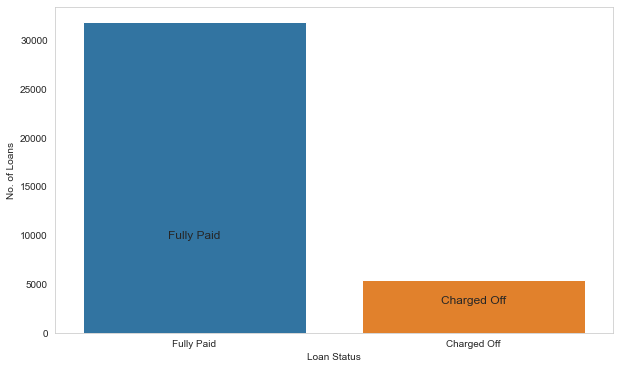

In [97]:
plt.figure(figsize=(10,6))
ax = sns.countplot(x="loan_status", data=loan)
ax.annotate('Fully Paid',xy=(0.25,0.3),xycoords='axes fraction',horizontalalignment='center',verticalalignment='center',fontsize=12)
ax.annotate('Charged Off',xy=(0.75,0.1),xycoords='axes fraction',horizontalalignment='center',verticalalignment='center',fontsize=12)
ax.set(xlabel='Loan Status', ylabel='No. of Loans')
plt.show()

**Conclusion:** Defaulted loan are low in numbers compared to Fully Paid.

In [98]:
# Loan Amount
print(loan.loan_amnt.describe())
#Plotting histogram of loan amount
px.box(loan,x='loan_amnt',width=750,height=350,title='Distribution of Loan Amount',labels={'loan_amnt':'Loan Amount'}).show()

count    37173.000000
mean     11034.824335
std       7272.289190
min        500.000000
25%       5400.000000
50%       9800.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64


**Conclusion**: The loan amount varies from 500 to 35000 with a mean of 9800.

36    75.37729
60    24.62271
Name: term, dtype: float64


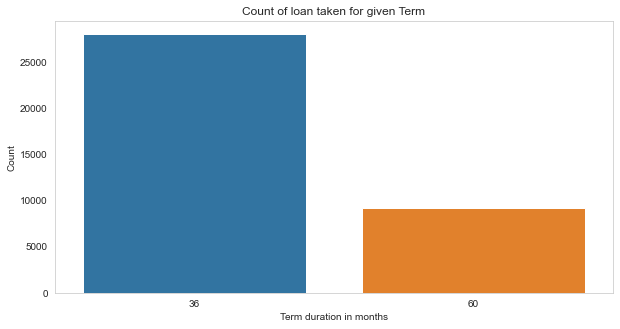

In [100]:
# Term of loan 
print(loan.term.value_counts()*100/loan.term.count())
# 0=Fully Paid, 1=Charged Off
plt.figure(figsize=(10,5))
ax=sns.countplot(x="term", data=loan)
ax.set_title('Count of loan taken for given Term')
ax.set_xlabel('Term duration in months')
ax.set_ylabel('Count')
plt.show()

**Conclusion**: More than half of the loan taken has term of 36 months compared to 60 months.

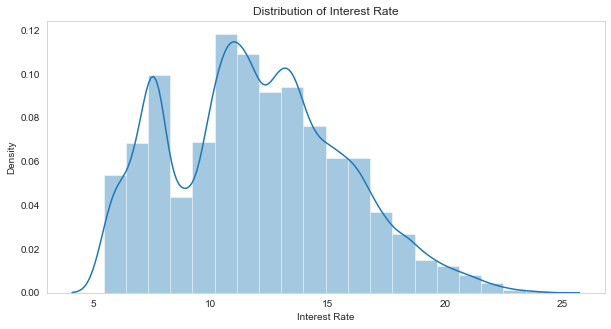

In [103]:
# Distribution of interest rate
plt.figure(figsize=(10,5))
sns.distplot(sorted(loan.int_rate),kde=True,bins=20)
plt.xlabel('Interest Rate')
plt.ylabel('Density')
plt.title('Distribution of Interest Rate')
plt.show()

**Conclusion**: The interest rate is more crowded around 5-10 and 10-15 with a drop near 10.

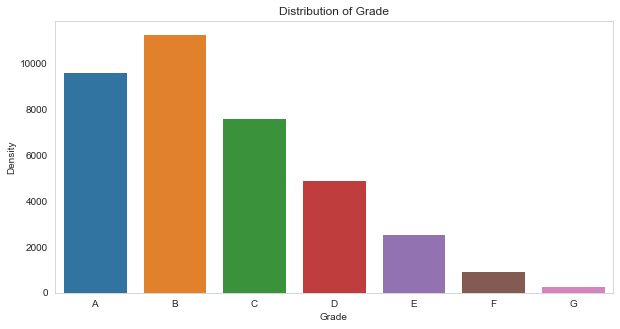

In [105]:
# Distribution of Grade
plt.figure(figsize=(10,5))
sns.countplot(x ='grade', data = loan)
plt.xlabel('Grade')
plt.ylabel('Density')
plt.title('Distribution of Grade')
plt.show()

**Conclusion**: A large amount of loans are with grade 'A' and 'B' commpared to rest showing most loans are high grade loans.

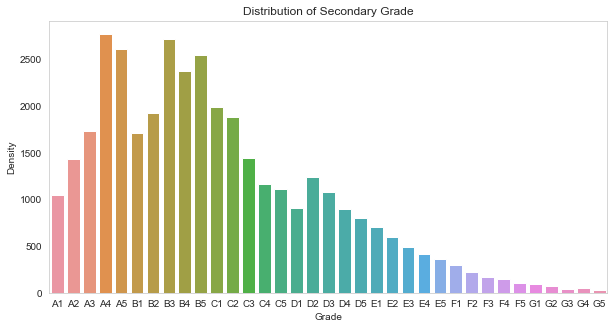

In [108]:
# Distribution of secondary grade
plt.figure(figsize=(10,5))
sns.countplot(x = 'sub_grade', data = loan)
plt.xlabel('Grade')
plt.ylabel('Density')
plt.title('Distribution of Secondary Grade')
plt.show()

**Conclusion**: A large amount of loans are with lower subgrade in grade 'A' and 'B' commpared to rest showing most loans are high grade loans. This matches with the Grade distribution.

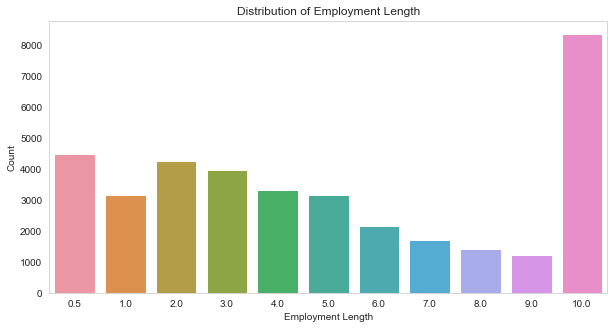

In [110]:
# Distribution of emp_length
plt.figure(figsize=(10,5))
sns.countplot(data = loan, x = 'emp_length')
plt.xlabel('Employment Length')
plt.ylabel('Count')
plt.title('Distribution of Employment Length',fontsize=12)
plt.show()

**Conclusion**: Majority of borrowsers have working experience greater than 10 years.

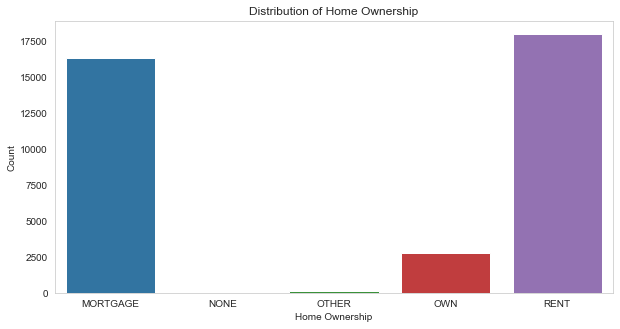

In [112]:
# Distribution of home_ownership
plt.figure(figsize=(10,5))
sns.countplot(data = loan, x = 'home_ownership')
plt.xlabel('Home Ownership')
plt.ylabel('Count')
plt.title('Distribution of Home Ownership',fontsize=12)
plt.show()

**Conclusion**: Majority of borrowsers don't posses property and are on mortage or rent.

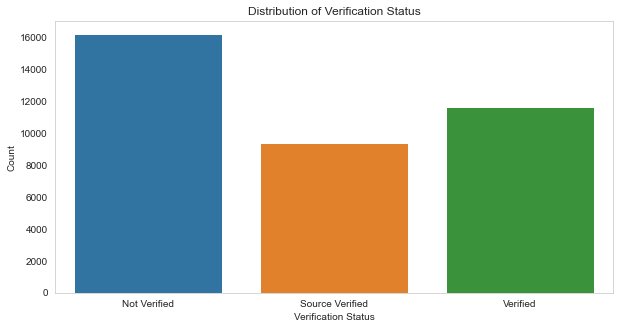

In [113]:
# Distribution of verification_status
plt.figure(figsize=(10,5))
sns.countplot(data = loan, x= 'verification_status')
plt.xlabel('Verification Status')
plt.ylabel('Count')
plt.title('Distribution of Verification Status',fontsize=12)
plt.show()

**Conclusion**: About 50% of the borrowers are verified by the company or have source verified.

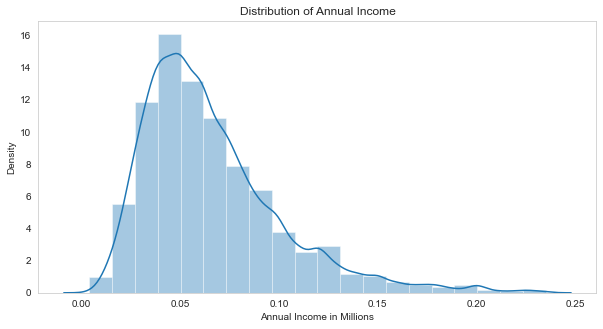

In [121]:
# Distribution of annual_inc
plt.figure(figsize=(10,5))
sns.distplot(loan.annual_inc/1000000,kde=True,bins=20)
plt.xlabel('Annual Income in Millions')
plt.ylabel('Density')
plt.title('Distribution of Annual Income',fontsize=12)
plt.show()

**Conclusion**: Annual Income shows left skewed normal distribution thus we can say that the majority of burrowers have very low annual income compared to rest.

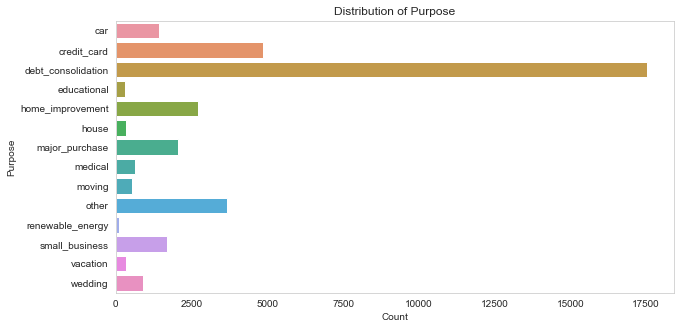

In [122]:
# Distribution of purpose
plt.figure(figsize=(10,5))
sns.countplot(y=loan.purpose)
plt.xlabel('Count')
plt.ylabel('Purpose')
plt.title('Distribution of Purpose',fontsize=12)
plt.show()

**Conclusion**: A large percentage of loans are taken for debt consolidation followed by credit card.

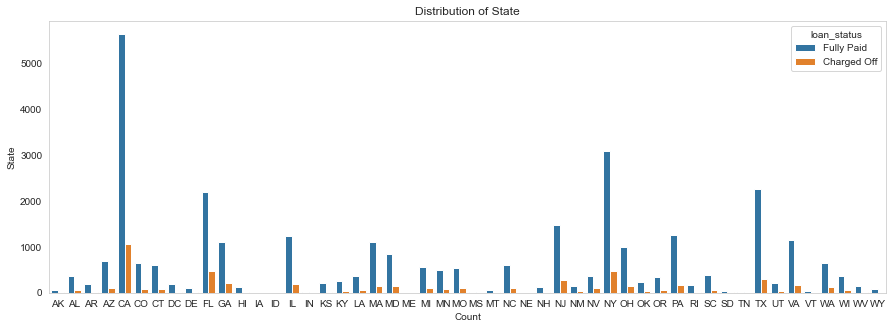

In [126]:
# Distribution of addr_state
plt.figure(figsize=(15,5))
sns.countplot(data = loan, x = 'addr_state',hue=loan['loan_status'])
plt.xlabel('Count')
plt.ylabel('State')
plt.title('Distribution of State',fontsize=12)
plt.show()

**Conclusion**: Majority of the borrowers are from the large urban cities like california, new york, texas, florida etc.

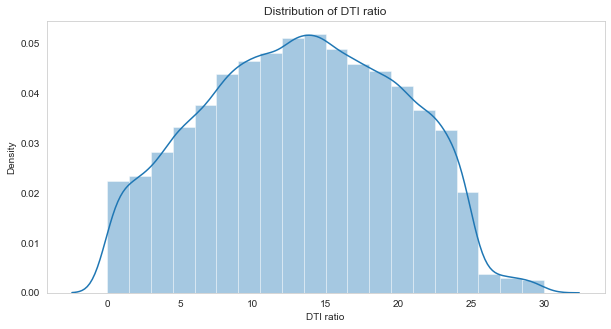

In [127]:
# Distribution of dti
plt.figure(figsize=(10,5))
sns.distplot(loan.dti,kde=True,bins=20)
plt.xlabel('DTI ratio')
plt.ylabel('Density')
plt.title('Distribution of DTI ratio',fontsize=12)
plt.show()

**Conclusion**: Majority of the borrowers have very large debt compared to the income registerd, concentrated in the 10-15 DTI ratio.

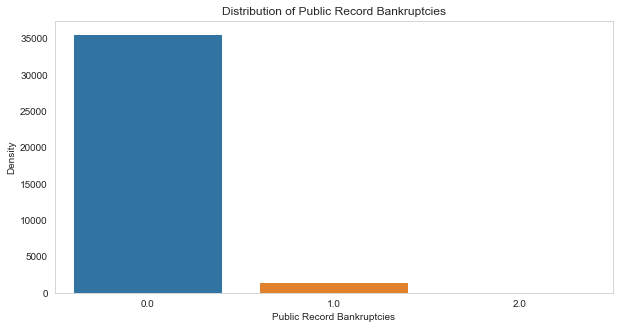

In [131]:
# Distribution of pub_rec_bankruptcies
plt.figure(figsize=(10,5))
sns.countplot(data = loan, x = 'pub_rec_bankruptcies')
plt.xlabel('Public Record Bankruptcies')
plt.ylabel('Density')
plt.title('Distribution of Public Record Bankruptcies',fontsize=12)
plt.show()

**Conclusion**: Majority of the borrowers have no record of Public Recorded Bankruptcy.

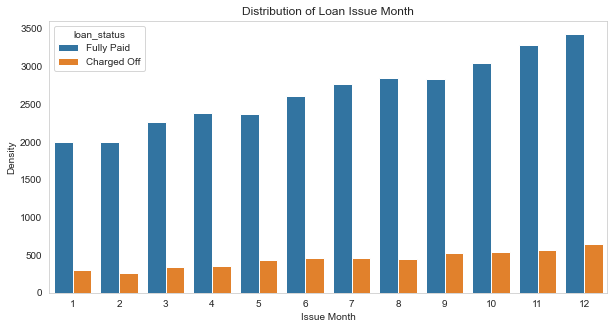

In [133]:
# Distribution of issue_month
plt.figure(figsize=(10,5))
sns.countplot(data = loan, x = 'issue_month',hue=loan['loan_status'])
plt.xlabel('Issue Month')
plt.ylabel('Density')
plt.title('Distribution of Loan Issue Month',fontsize=12)
plt.show()

**Conclusion**: Majority of the loans are given in last quarter of the year.

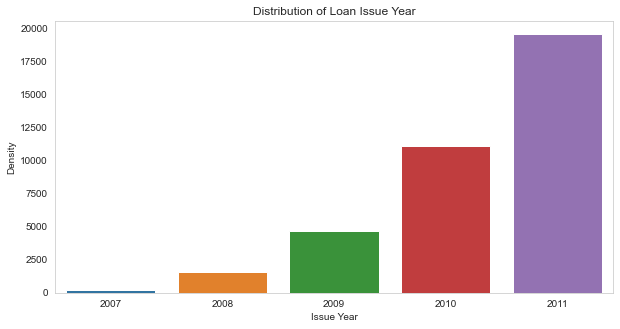

In [135]:
# Distribution of issue_year
plt.figure(figsize=(10,5))
sns.countplot(data = loan, x = 'issue_year')
plt.xlabel('Issue Year')
plt.ylabel('Density')
plt.title('Distribution of Loan Issue Year',fontsize=12)
plt.show()

**Conclusion**: The number of loans approved increases with the time at expontential rate, thus we can say that the loan approval rate is increasing with the time.

## Segemented Univariate Analysis

#### Segmented analysis here means that the data variable is analyzed in subsets and is very useful as it can show the change metric in pattern across the different segments of the same variable.

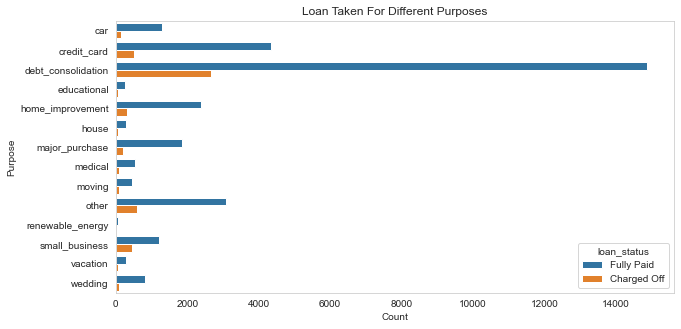

In [136]:
# Distribution of purpose based on loan_status
plt.figure(figsize=(10,5))
sns.countplot(data=loan,y='purpose',hue='loan_status')
plt.xlabel('Count')
plt.ylabel('Purpose')
plt.title('Loan Taken For Different Purposes',fontsize=12)
plt.show()

**Conclusion:** Debt Consolidation is the most popular loan purpose and has highest number of fully paid loan and defaulted loan.

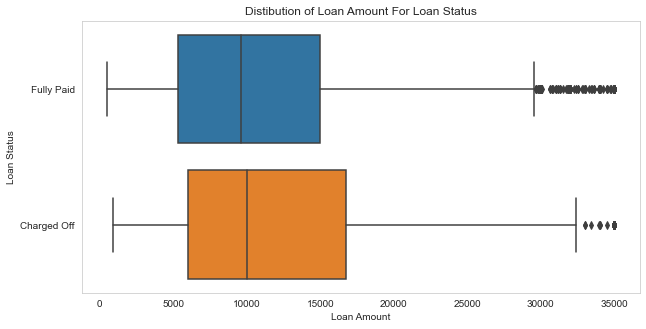

In [137]:
# Distribution of loan_amnt based on loan_status
plt.figure(figsize=(10,5))
sns.boxplot(data=loan,x='loan_amnt',y='loan_status')
plt.xlabel('Loan Amount')
plt.ylabel('Loan Status')
plt.title('Distibution of Loan Amount For Loan Status',fontsize=12)
plt.show()

**Conclusion:** The mean and 25% percentile are same for both but we see larger 75% percentile in the defaulted loan which indicate large amount of loan has higher chance of defaulting.

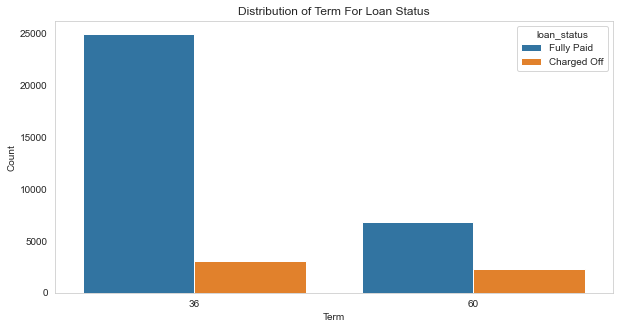

In [139]:
# Distribution of Term based on loan_status
plt.figure(figsize=(10,5))
sns.countplot(data=loan,x='term',hue='loan_status')
plt.xlabel('Term')
plt.ylabel('Count')
plt.title('Distribution of Term For Loan Status',fontsize=12)
plt.show()

**Conclusion:** The 60 month term has higher chance of defaulting than 36 month term whereas the 36 month term has higher chance of fully paid loan.

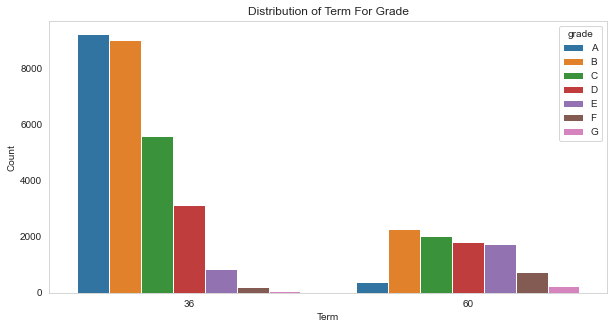

In [140]:
# Distribution of Term based on Grade
plt.figure(figsize=(10,5))
sns.countplot(data=loan,x='term',hue='grade')
plt.xlabel('Term')
plt.ylabel('Count')
plt.title('Distribution of Term For Grade',fontsize=12)
plt.show()

**Conclusion:** The loans in 36 month term majorily consist of grade A and B loans whereas the loans in 60 month term mostly consist of grade B, C and D loans.

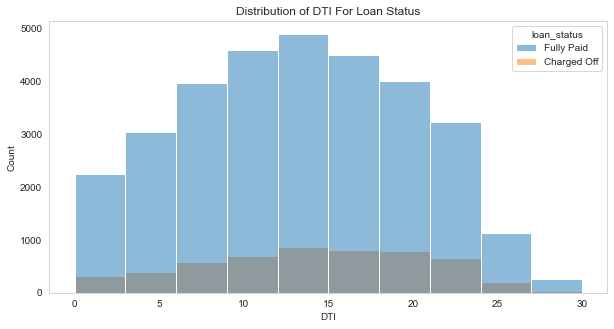

In [141]:
# Distribution of DTI based on Grade
plt.figure(figsize=(10,5))
sns.histplot(data=loan,x='dti',hue='loan_status',bins=10)
plt.xlabel('DTI')
plt.ylabel('Count')
plt.title('Distribution of DTI For Loan Status',fontsize=12)
plt.show()

**Conclusion:** The Loan Status varies with DTI ratio, we can see that the loans in DTI ratio 10-15 have higher number of defaulted loan but higher dti has higher chance of defaulting.

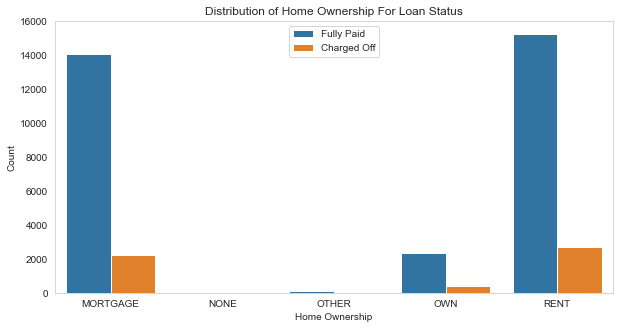

In [143]:
# Distribution of house_ownership based on loan_status
plt.figure(figsize=(10,5))
sns.countplot(data=loan,x='home_ownership',hue='loan_status')
plt.xlabel('Home Ownership')
plt.ylabel('Count')
plt.title('Distribution of Home Ownership For Loan Status',fontsize=12)
plt.legend(loc='upper center')
plt.show()

**Conclusion:** The Defaulted loan are lower for the burrowers which own their property compared to on mortgage or rent.

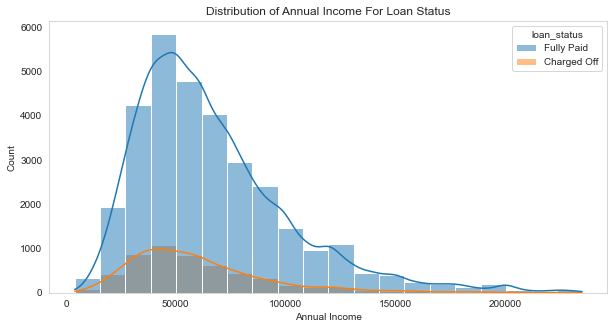

In [144]:
# Distribution of annual_inc based on loan_status
plt.figure(figsize=(10,5))
sns.histplot(data=loan,x='annual_inc',hue='loan_status',bins=20,kde=True)
plt.xlabel('Annual Income')
plt.ylabel('Count')
plt.title('Distribution of Annual Income For Loan Status',fontsize=12)
plt.show()

**Conclusion:** Borrowers with less 50000 annual income are more likely to default and higher annual income are less likely to default.

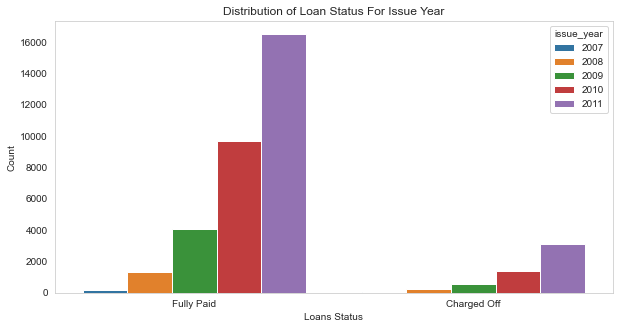

In [145]:
# Distribution of loan_status based on issue_year
plt.figure(figsize=(10,5))
sns.countplot(data=loan,x='loan_status',hue='issue_year')
plt.xlabel('Loans Status')
plt.ylabel('Count')
plt.title('Distribution of Loan Status For Issue Year',fontsize=12)
plt.show()

**Conclusion:** The Fully paid loan are increasing exponentially with the time compared to defaulted loan.

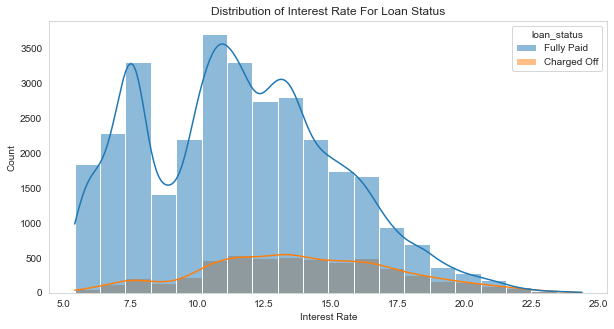

In [147]:
# Distribution of int_amnt based on loan_status
plt.figure(figsize=(10,5))
sns.histplot(data=loan,x='int_rate',hue='loan_status', bins=20, kde=True)
plt.xlabel('Interest Rate')
plt.ylabel('Count')
plt.title('Distribution of Interest Rate For Loan Status',fontsize=12)
plt.show()

**Conclusion:** The default loan amount increases with interest rate and shows are decline aftre 17.5 % interest rate.

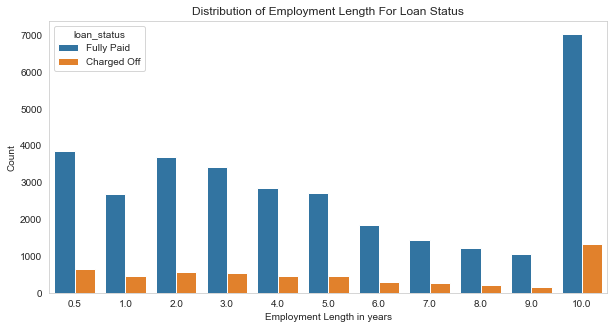

In [148]:
# Distribution of emp_length based on loan_status
plt.figure(figsize=(10,5))
sns.countplot(data=loan,x='emp_length',hue='loan_status')
plt.xlabel('Employment Length in years')
plt.ylabel('Count')
plt.title('Distribution of Employment Length For Loan Status',fontsize=12)
plt.show()

**Conclusion:** The Employees with 10+ years of experience are likely to default and have higher chance of fully paying the loan.

## Bivariate Analysis

#### Bivariate analysis is one of the simplest forms of quantitative analysis. It involves the analysis of two variables, for the purpose of determining the empirical relationship between them.

In [170]:
# Derived columns
# categorise loan amounts into buckets which will help in analysis further in bivariate analysis.
loan['loan_amnt_cats'] = pd.cut(loan['loan_amnt'], [0, 7000, 14000, 21000, 28000, 35000], labels=['0-7000', '7000-14000', '14000-21000', '21000-28000', '28000 +'])

# categorise annual incomes into buckets which will help in analysis further in bivariate analysis.
loan['annual_inc_cats'] = pd.cut(loan['annual_inc'], [0, 20000, 40000, 60000, 80000,1000000], labels=['0-20000', '20000-40000', '40000-60000', '60000-80000', '80000 +'])

# categorise intrest rates into buckets which will help in analysis further in bivariate analysis.
loan['int_rate_cats'] = pd.cut(loan['int_rate'], [0, 10, 12.5, 16, 20], labels=['0-10', '10-13', '12.5-16', '16 +'])

# categorise dti into buckets for bivariate analysis.
loan['dti_cats'] = pd.cut(loan['dti'], [0, 5, 10, 15, 20, 25], labels=['0-5', '05-10', '10-15', '15-20', '25+'])

In [171]:
loan.head()

,id,loan_amnt,term,int_rate,grade,sub_grade,emp_length,home_ownership,verification_status,annual_inc,...,purpose,addr_state,dti,pub_rec_bankruptcies,issue_year,issue_month,loan_amnt_cats,annual_inc_cats,int_rate_cats,dti_cats
0,1077501,5000,36,10.65,B,B2,10.0,RENT,Verified,24000.0,...,credit_card,AZ,27.65,0.0,2011,12,0-7000,20000-40000,10-13,NaN
1,1077430,2500,60,15.27,C,C4,0.5,RENT,Source Verified,30000.0,...,car,GA,1.00,0.0,2011,12,0-7000,20000-40000,12.5-16,0-5
2,1077175,2400,36,15.96,C,C5,10.0,RENT,Not Verified,12252.0,...,small_business,IL,8.72,0.0,2011,12,0-7000,0-20000,12.5-16,05-10
3,1076863,10000,36,13.49,C,C1,10.0,RENT,Source Verified,49200.0,...,other,CA,20.00,0.0,2011,12,7000-14000,40000-60000,12.5-16,15-20
5,1075269,5000,36,7.90,A,A4,3.0,RENT,Source Verified,36000.0,...,wedding,AZ,11.20,0.0,2011,12,0-7000,20000-40000,0-10,10-15


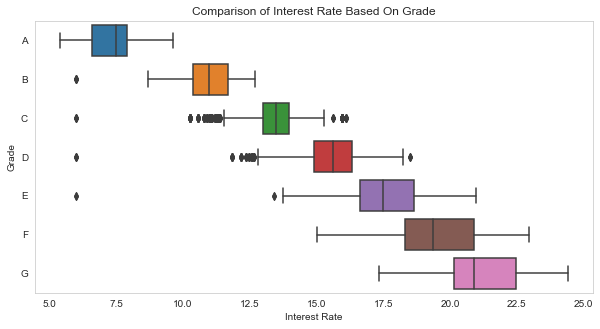

In [149]:
# Comparison of interest rate based on grade
plt.figure(figsize=(10,5))
sns.boxplot(data=loan,x='int_rate',y='grade')
plt.xlabel('Interest Rate')
plt.ylabel('Grade')
plt.title('Comparison of Interest Rate Based On Grade',fontsize=12)
plt.show()

**Conclusion:** The Grade represent risk factor thus we can say interst rate increases with the risk.

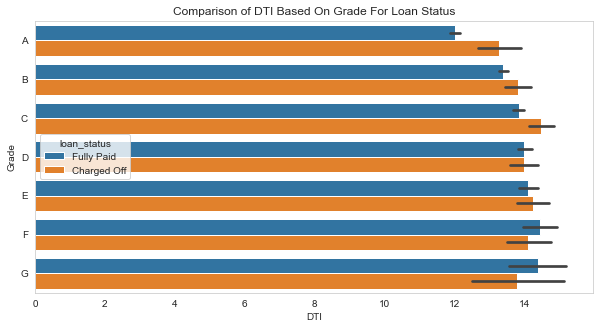

In [152]:
# Comparison of DTI over grade for loan status
plt.figure(figsize=(10,5))
sns.barplot(data=loan,x='dti',y='grade',hue='loan_status')
plt.xlabel('DTI')
plt.ylabel('Grade')
plt.title('Comparison of DTI Based On Grade For Loan Status',fontsize=12)
plt.show()

**Conclusion:** 
- The Grade A which is lowest risk also has lowest DTI ratio which we can say that higher grade has lower rate of default.

<Figure size 720x360 with 0 Axes>

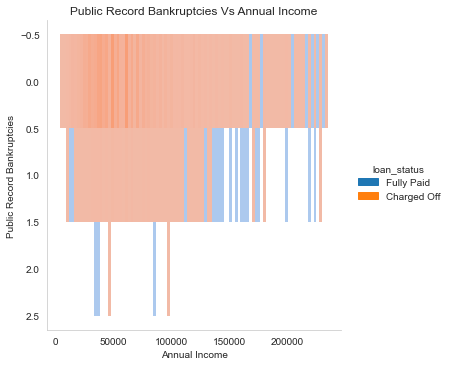

In [154]:
# Comparison of annual income to public record bankruptcy over loan status
plt.figure(figsize=(10,5))
sns.displot(y=loan.pub_rec_bankruptcies.astype('category'),x=loan.annual_inc,hue=loan.loan_status)
plt.xlabel('Annual Income')
plt.ylabel('Public Record Bankruptcies')
plt.title('Public Record Bankruptcies Vs Annual Income',fontsize=12)
plt.show()

**Conclusion:** The borrowers are mostly having no record of Public Recorded Bankruptcy and are safe choice for loan issue.

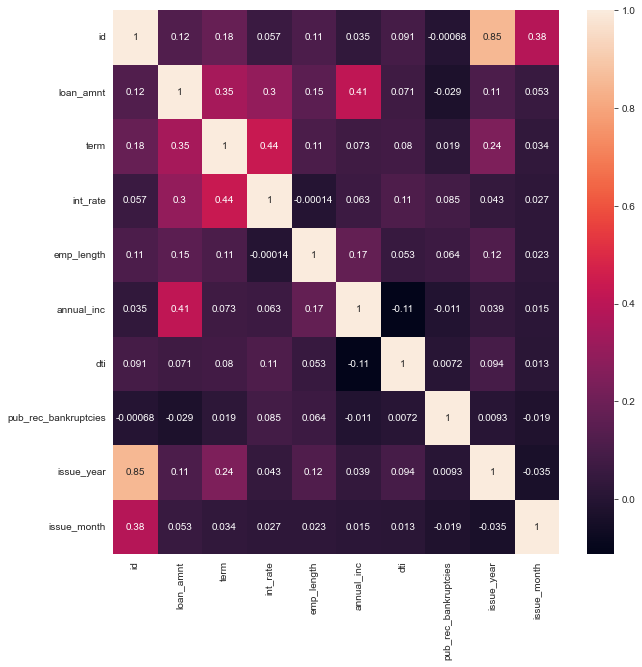

In [155]:
# Heatmap of correlation between variables
plt.figure(figsize=(10,10))
sns.heatmap(loan.corr(),annot=True)
plt.show()

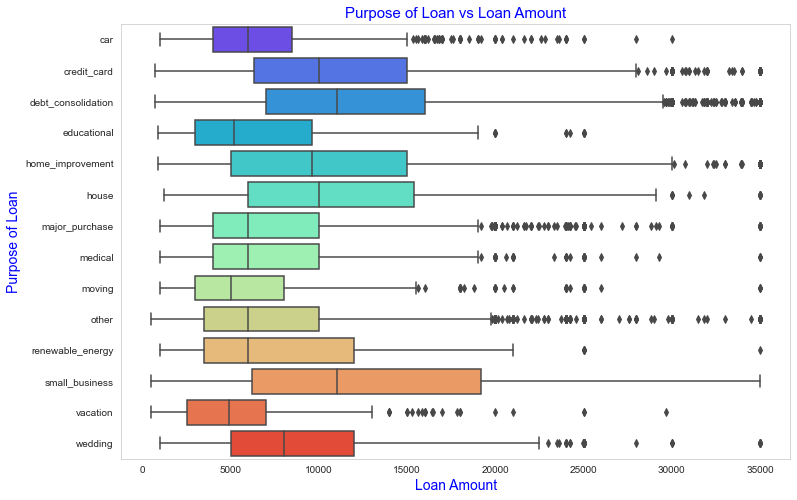

In [183]:
# Bivariate Analysis - Purpose of loan vs Loan amount
# Box Plot

plt.figure(figsize=(12,8))
ax = sns.boxplot(y='purpose', x='loan_amnt', data =loan,palette='rainbow')
ax.set_title('Purpose of Loan vs Loan Amount',fontsize=15,color='b')
ax.set_ylabel('Purpose of Loan',fontsize=14,color = 'b')
ax.set_xlabel('Loan Amount',fontsize=14,color = 'b')
plt.show()

### **Conclusion:**
- Median,95th percentile,75th percentile of loan amount is highest for loan taken for small business purpose among all purposes.
- Debt consolidation is second and Credit card comes 3rd.

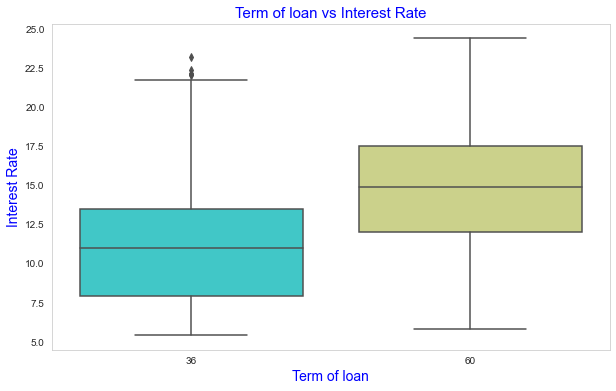

In [186]:
# Bivariate Analysis - Term of loan vs Interest Rate
# Box Plot

plt.figure(figsize=(10,6))
ax = sns.boxplot(y='int_rate', x='term', data =loan,palette='rainbow')
ax.set_title('Term of loan vs Interest Rate',fontsize=15,color='b')
ax.set_ylabel('Interest Rate',fontsize=14,color = 'b')
ax.set_xlabel('Term of loan',fontsize=14,color = 'b')
plt.show()

### **Conclusion:**
- It is clear that avearge intrest rate is higher for 60 months loan term.
- Most of the loans issued for longer term had higher intrest rates for repayement.

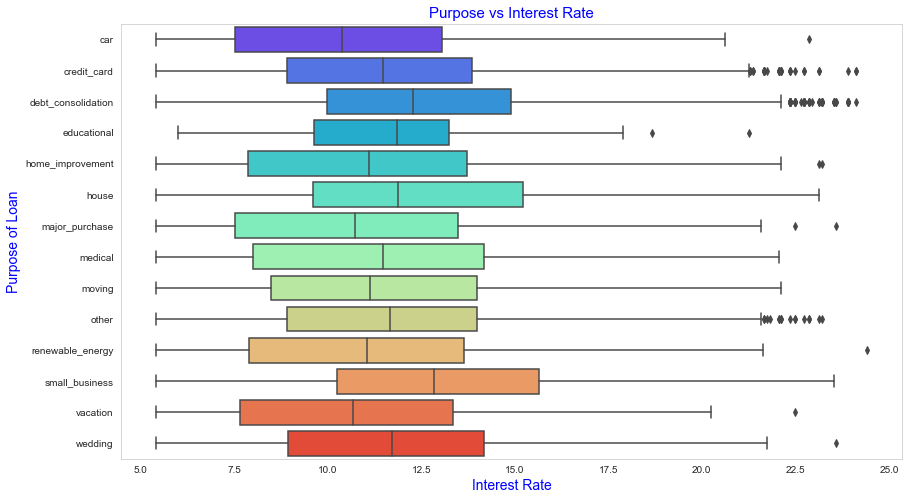

In [188]:
# Bivariate Analysis - Purpose vs Interest Rate
# Box Plot

plt.figure(figsize=(14,8))
ax = sns.boxplot(x='int_rate', y='purpose', data =loan,palette='rainbow')
ax.set_title('Purpose vs Interest Rate',fontsize=15,color='b')
ax.set_xlabel('Interest Rate',fontsize=14,color = 'b')
ax.set_ylabel('Purpose of Loan',fontsize=14,color = 'b')
plt.show()

### **Conclusion:**
- It is clear that avearge intrest rate is highest for small business purpose.
- Loans taken for small business purposes had to repay the loan with more intrest rate as compared to other.
- Debt consolidation is 2nd where borrowers had to pay more interest rate.

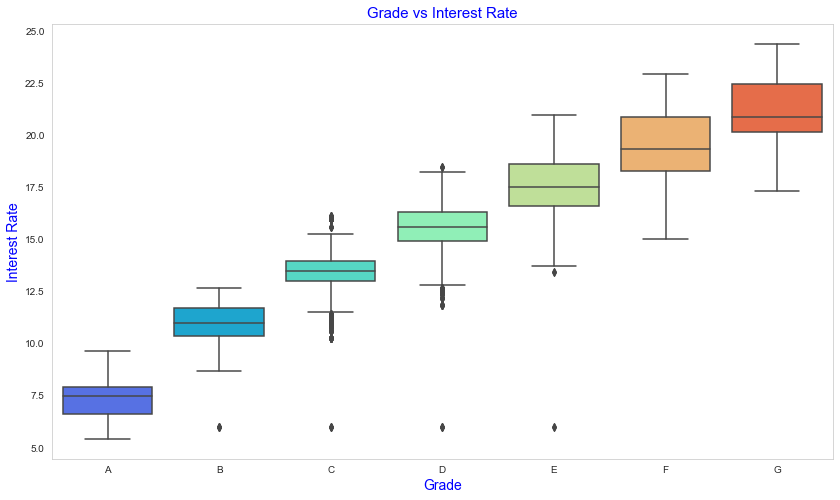

In [192]:
# Bivariate Analysis - Grade vs Interest Rate
# Box Plot

plt.figure(figsize=(14,8))
ax = sns.boxplot(y='int_rate', x='grade', data =loan,palette='rainbow',order = 'ABCDEFG')
ax.set_title('Grade vs Interest Rate',fontsize=15,color='b')
ax.set_ylabel('Interest Rate',fontsize=14,color = 'b')
ax.set_xlabel('Grade',fontsize=14,color = 'b')
plt.show()

### **Conclusion:**
- A-grade is a top letter grade for a lender to assign to a borrower.
- The higher the borrower's credit grade,the lower the interest rate offered to that borrower on a loan.
- It is clear that intrest rate is increasing with grades moving from A to F.

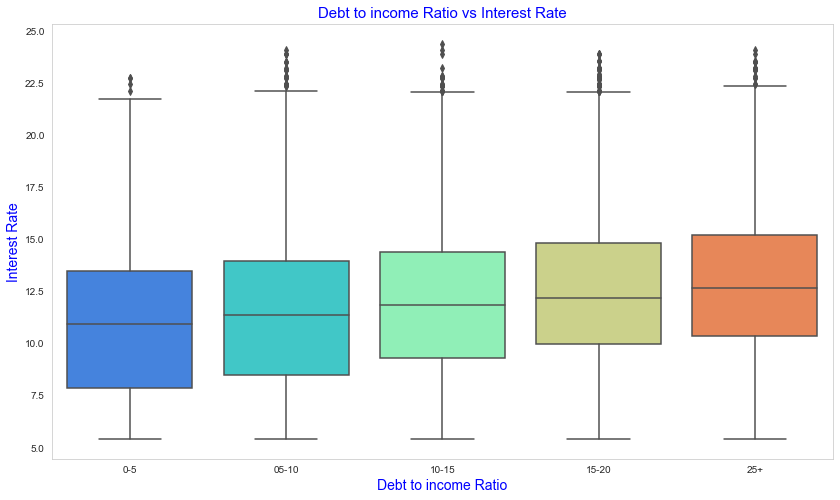

In [185]:
# Bivariate Analysis - dti vs Interest Rate
# Box Plot

plt.figure(figsize=(14,8))
ax = sns.boxplot(y='int_rate', x='dti_cats', data =loan,palette='rainbow')
ax.set_title('Debt to income Ratio vs Interest Rate',fontsize=15,color='b')
ax.set_ylabel('Interest Rate',fontsize=14,color = 'b')
ax.set_xlabel('Debt to income Ratio',fontsize=14,color = 'b')
plt.show()

### **Conclusion:**
- If your DTI is low enough you may get a lower interest rate.
- Plot shows no significant variation but there is slight increase in interest rate with increase in DTI.

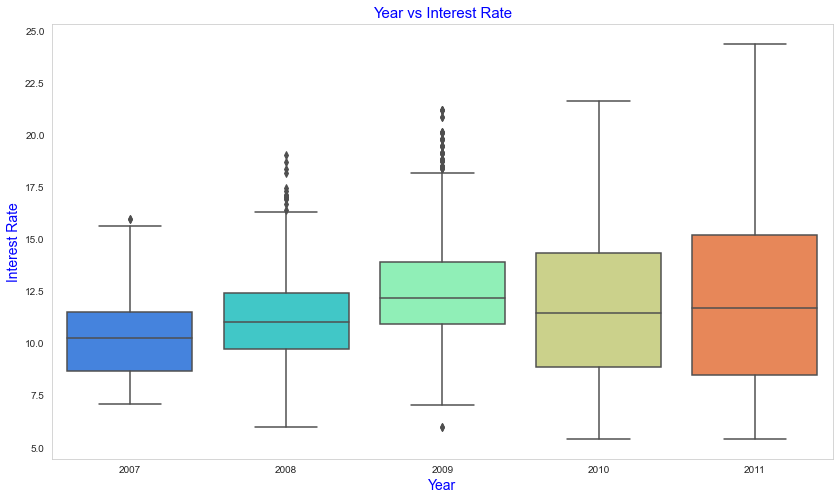

In [161]:
# Bivariate Analysis - year vs Interest Rate
# Box Plot

plt.figure(figsize=(14,8))
ax = sns.boxplot(y='int_rate', x='issue_year', data =loan,palette='rainbow')
ax.set_title('Year vs Interest Rate',fontsize=15,color='b')
ax.set_ylabel('Interest Rate',fontsize=14,color = 'b')
ax.set_xlabel('Year',fontsize=14,color = 'b')
plt.show()


### **Conclusion:**
- Plot shows intrest rate is increasing slowly with increase in year.

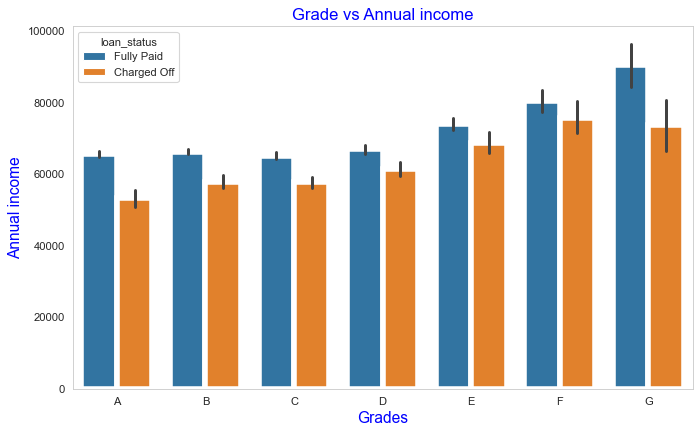

In [168]:
# Bivariate analysis
# BarPlot to show variation of annual income across grade for every loan status.

plt.figure(figsize=(10,6), dpi=80, edgecolor = 'm')
ax=sns.barplot(x='grade', y='annual_inc', hue="loan_status", data=loan, estimator=np.mean,order='ABCDEFG')
ax.set_title('Grade vs Annual income',fontsize=15,color='b')
ax.set_ylabel('Annual income',fontsize=14,color = 'b')
ax.set_xlabel('Grades',fontsize=14,color = 'b')
plt.setp(ax.patches, linewidth=5)
plt.show()

### **Conclusion:**
- From this we can conclude that the ones getting 'charged off' have lower annual incomes than the ones who'paid fully' for each and every grade (i.e. at same interest range)

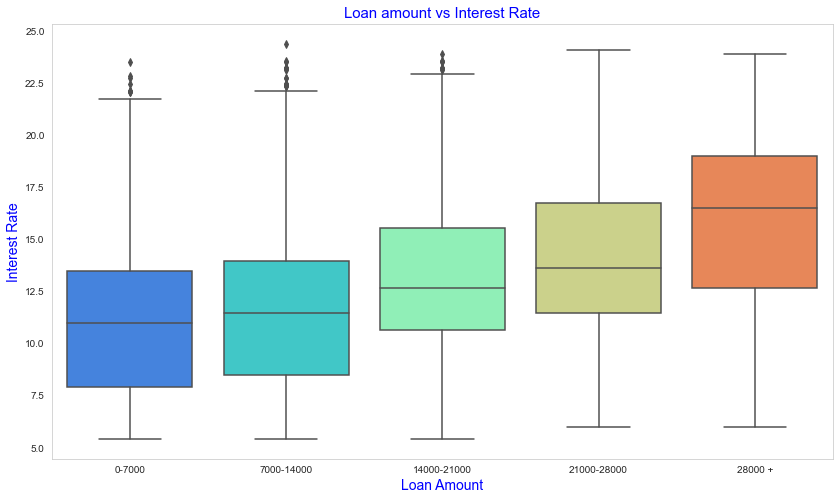

In [175]:
# Bivariate Analysis - Loan Amount vs Interest Rate
# Box Plot

plt.figure(figsize=(14,8))
ax = sns.boxplot(y='int_rate', x='loan_amnt_cats', data =loan,palette='rainbow')
ax.set_title('Loan amount vs Interest Rate',fontsize=15,color='b')
ax.set_ylabel('Interest Rate',fontsize=14,color = 'b')
ax.set_xlabel('Loan Amount',fontsize=14,color = 'b')
plt.show()



### **Conclusion:**
- It is clear that intrest rate is increasing with loan amount increase.
- probably when loan amount is more it is taken for longer loan term, we saw earlier that longer the loan term more the interest rate.

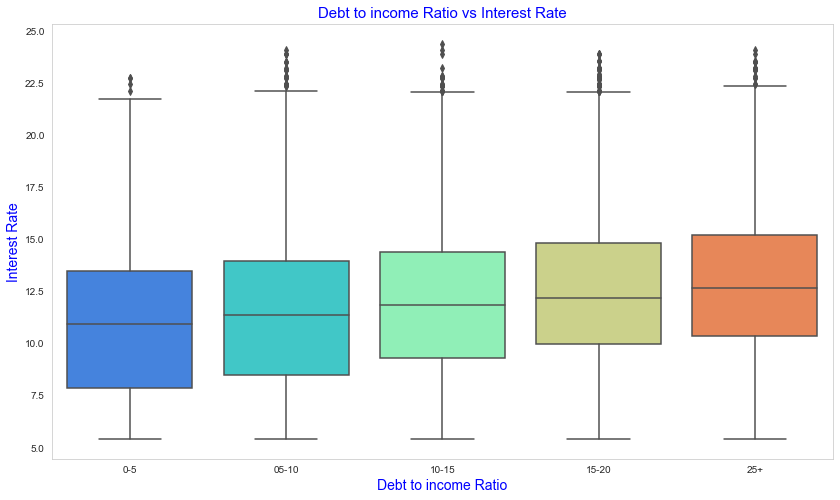

In [177]:
# Bivariate Analysis - dti vs Interest Rate
# Box Plot

plt.figure(figsize=(14,8))
ax = sns.boxplot(y='int_rate', x='dti_cats', data =loan,palette='rainbow')
ax.set_title('Debt to income Ratio vs Interest Rate',fontsize=15,color='b')
ax.set_ylabel('Interest Rate',fontsize=14,color = 'b')
ax.set_xlabel('Debt to income Ratio',fontsize=14,color = 'b')
plt.show()



### **Conclusion:**
- If your DTI is low enough you may get a lower interest rate.
- Plot shows no significant variation but there is slight increase in interest rate with increase in DTI.

## Multivariate Analayis

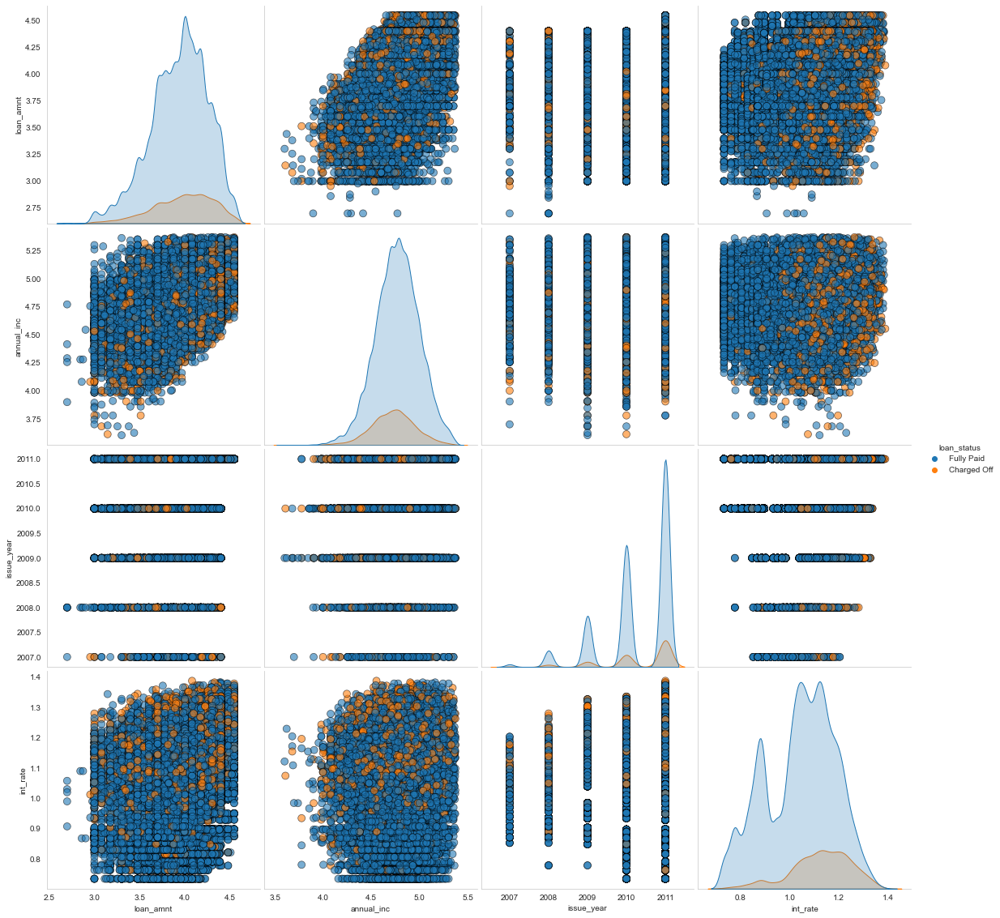

In [179]:
# Lets draw a pair plot for multivariate analysis
# Pick few imporatnt columns from dataset separately.

loan_pair = loan[['loan_amnt', 'annual_inc', 'issue_year','int_rate','loan_status']].copy()
loan_pair.head()

# Take the log of below variables as they are heavily skewed
loan_pair['loan_amnt'] = np.log10(loan_pair['loan_amnt'])
loan_pair['annual_inc'] = np.log10(loan_pair['annual_inc'])
loan_pair['int_rate'] = np.log10(loan_pair['int_rate'])

# Create a pair plot colored by loan status with a density plot of the # diagonal and format the scatter plots.
sns.pairplot(loan_pair, hue = 'loan_status', diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 4)
plt.show()



### **Conclusion:**
- Higher the interest rate higher charged off ratio
- Higher the annual income higher the loan amount slightly.
- increase in number of charged off with increase in year.
- interest rate is increasing with loan amount increase

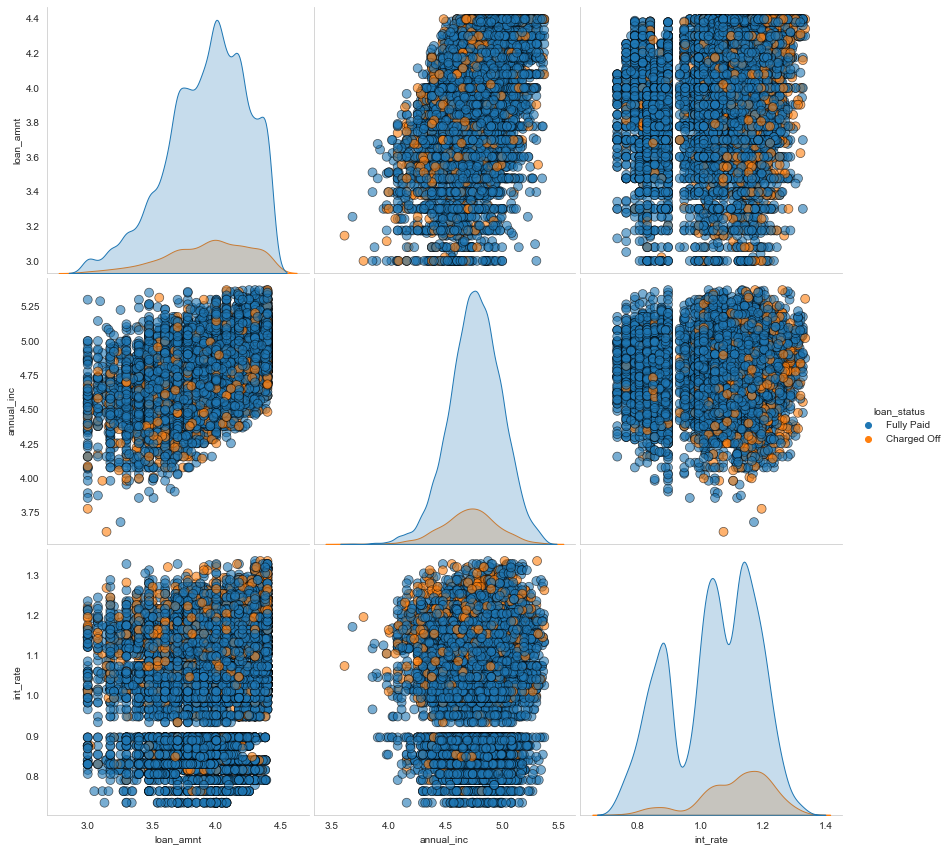

In [181]:
# Lets draw a pair plot for multivariate analysis
# Pick few imporatnt columns from dataset separately.
# Above plot is too dense so just pick year 2010 for getting some insights.

sns.pairplot(loan_pair[loan_pair['issue_year'] == 2010], 
             vars = ['loan_amnt', 'annual_inc', 'int_rate'], 
             hue = 'loan_status', diag_kind = 'kde', 
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 4);


### **Conclusion:**
- Higher the interest rate higher charged off ratio
- Higher the annual income higher the loan amount slightly
- Interest rate is increasing with loan amount increase this results in high charged off.

## **Recommendations:**
- Lending Club should consider accepting more loans from applicants whose annual income is greater than 100000 as their probability of charge off is minimum.

- Lending Club should consider accepting more loans of grade A and B. It should be cautious of loans falling in grades E,F and G.

- Lending Club should be wary of the loans where the purpose is Small Business as the percentage of a loan being charged off is maximum 27.1%.

- Lending Club should consider accepting more loans from people who owns a house.

- Lending Club should accept more loans for the term of 36 months as the % of charged off loans is less and the no. of loan applicants are more. Also the avg fully paid loan amount is increasing over the years and avg charged off loan amount is decreasing over the years.

- Borrowers with very high Debt to Income value have the tendency to default.

- Borrowers with working experience 10+ years.